In [1]:
import sklearn.tree as dt
from sklearn.tree import DecisionTreeClassifier, export, export_graphviz
from sklearn.model_selection import GridSearchCV
import sklearn.naive_bayes as nb
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier

In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

import statsmodels.formula.api as sm
import scipy.stats as stats
import pandas_profiling
%matplotlib inline
plt.rcParams['figure.figsize'] = 12, 8
plt.rcParams['axes.grid'] = True
plt.gray()

<Figure size 864x576 with 0 Axes>

In [3]:
from matplotlib.backends.backend_pdf import PdfPages
from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn.linear_model import LogisticRegression
from statsmodels.stats.outliers_influence import variance_inflation_factor
from patsy import dmatrices 
from sklearn import preprocessing

In [4]:
pd.set_option('display.max_rows',None)

In [5]:
col_names = ["duration","protocol_type","service","flag","src_bytes","dst_bytes","land", "wrong_fragment","urgent","hot","num_failed_logins","logged_in", "num_compromised","root_shell","su_attempted","num_root","num_file_creations", "num_shells","num_access_files","num_outbound_cmds","is_host_login", "is_guest_login","count","srv_count","serror_rate",  "srv_serror_rate", "rerror_rate","srv_rerror_rate","same_srv_rate",  "diff_srv_rate", "srv_diff_host_rate","dst_host_count","dst_host_srv_count","dst_host_same_srv_rate", "dst_host_diff_srv_rate","dst_host_same_src_port_rate","dst_host_srv_diff_host_rate","dst_host_serror_rate","dst_host_srv_serror_rate","dst_host_rerror_rate","dst_host_srv_rerror_rate","attack","last_flag"]
netdata = pd.read_csv("./NSL_Dataset/Train.txt",header=None,names = col_names)
netdata_test = pd.read_csv("./NSL_Dataset/Test.txt",header=None,names = col_names)
netdata.head()

,duration,protocol_type,service,flag,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,...,dst_host_same_srv_rate,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate,attack,last_flag
0,0,tcp,ftp_data,SF,491,0,0,0,0,0,...,0.17,0.03,0.17,0.00,0.00,0.00,0.05,0.00,normal,20
1,0,udp,other,SF,146,0,0,0,0,0,...,0.00,0.60,0.88,0.00,0.00,0.00,0.00,0.00,normal,15
2,0,tcp,private,S0,0,0,0,0,0,0,...,0.10,0.05,0.00,0.00,1.00,1.00,0.00,0.00,neptune,19
3,0,tcp,http,SF,232,8153,0,0,0,0,...,1.00,0.00,0.03,0.04,0.03,0.01,0.00,0.01,normal,21
4,0,tcp,http,SF,199,420,0,0,0,0,...,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,normal,21


In [6]:
netdata.shape

(125973, 43)

In [7]:
netdata['Split'] = 'Train'
netdata_test['Split'] = 'Test'

In [8]:
netdata.drop(['last_flag'],axis = 1, inplace = True)
netdata_test.drop(['last_flag'],axis = 1, inplace = True)
netdata.head()

,duration,protocol_type,service,flag,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,...,dst_host_same_srv_rate,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate,attack,Split
0,0,tcp,ftp_data,SF,491,0,0,0,0,0,...,0.17,0.03,0.17,0.00,0.00,0.00,0.05,0.00,normal,Train
1,0,udp,other,SF,146,0,0,0,0,0,...,0.00,0.60,0.88,0.00,0.00,0.00,0.00,0.00,normal,Train
2,0,tcp,private,S0,0,0,0,0,0,0,...,0.10,0.05,0.00,0.00,1.00,1.00,0.00,0.00,neptune,Train
3,0,tcp,http,SF,232,8153,0,0,0,0,...,1.00,0.00,0.03,0.04,0.03,0.01,0.00,0.01,normal,Train
4,0,tcp,http,SF,199,420,0,0,0,0,...,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,normal,Train


In [9]:
netdata.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 125973 entries, 0 to 125972
Data columns (total 43 columns):
duration                       125973 non-null int64
protocol_type                  125973 non-null object
service                        125973 non-null object
flag                           125973 non-null object
src_bytes                      125973 non-null int64
dst_bytes                      125973 non-null int64
land                           125973 non-null int64
wrong_fragment                 125973 non-null int64
urgent                         125973 non-null int64
hot                            125973 non-null int64
num_failed_logins              125973 non-null int64
logged_in                      125973 non-null int64
num_compromised                125973 non-null int64
root_shell                     125973 non-null int64
su_attempted                   125973 non-null int64
num_root                       125973 non-null int64
num_file_creations             125973 

In [10]:
netdata.isnull().sum()

duration                       0
protocol_type                  0
service                        0
flag                           0
src_bytes                      0
dst_bytes                      0
land                           0
wrong_fragment                 0
urgent                         0
hot                            0
num_failed_logins              0
logged_in                      0
num_compromised                0
root_shell                     0
su_attempted                   0
num_root                       0
num_file_creations             0
num_shells                     0
num_access_files               0
num_outbound_cmds              0
is_host_login                  0
is_guest_login                 0
count                          0
srv_count                      0
serror_rate                    0
srv_serror_rate                0
rerror_rate                    0
srv_rerror_rate                0
same_srv_rate                  0
diff_srv_rate                  0
srv_diff_h

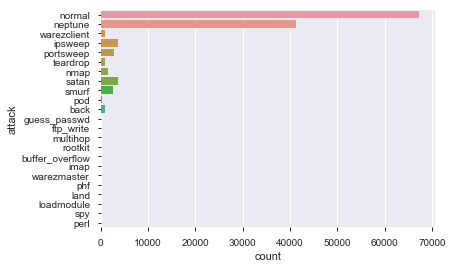

In [11]:
sns.countplot(y='attack', data = netdata)

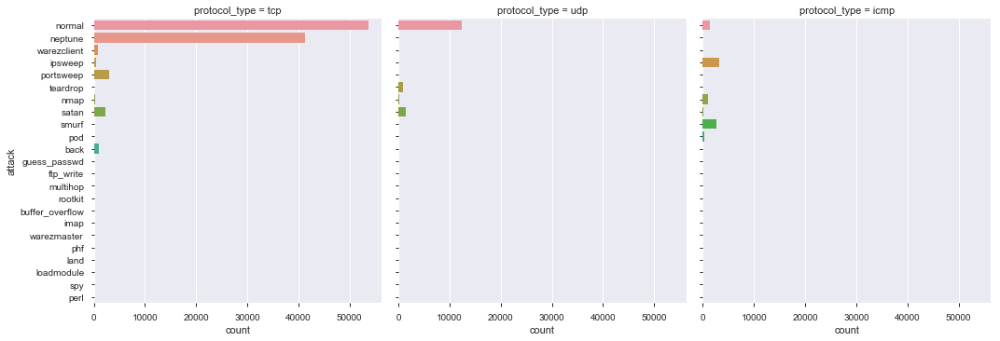

In [12]:
sns.catplot(y = 'attack', col = 'protocol_type', kind = 'count', data = netdata)

Normal attacks are highest followed by neptune in protocol_type tcp 

Normal attacks are highest in protocol_type udp

In [13]:
netdata['flag'].value_counts()

SF        74945
S0        34851
REJ       11233
RSTR       2421
RSTO       1562
S1          365
SH          271
S2          127
RSTOS0      103
S3           49
OTH          46
Name: flag, dtype: int64

In [14]:
netdata.groupby('attack').count()

,duration,protocol_type,service,flag,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,...,dst_host_srv_count,dst_host_same_srv_rate,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate,Split
attack,,,,,,,,,,,,,,,,,,,,,
back,956,956,956,956,956,956,956,956,956,956,...,956,956,956,956,956,956,956,956,956,956
buffer_overflow,30,30,30,30,30,30,30,30,30,30,...,30,30,30,30,30,30,30,30,30,30
ftp_write,8,8,8,8,8,8,8,8,8,8,...,8,8,8,8,8,8,8,8,8,8
guess_passwd,53,53,53,53,53,53,53,53,53,53,...,53,53,53,53,53,53,53,53,53,53
imap,11,11,11,11,11,11,11,11,11,11,...,11,11,11,11,11,11,11,11,11,11
ipsweep,3599,3599,3599,3599,3599,3599,3599,3599,3599,3599,...,3599,3599,3599,3599,3599,3599,3599,3599,3599,3599
land,18,18,18,18,18,18,18,18,18,18,...,18,18,18,18,18,18,18,18,18,18
loadmodule,9,9,9,9,9,9,9,9,9,9,...,9,9,9,9,9,9,9,9,9,9
multihop,7,7,7,7,7,7,7,7,7,7,...,7,7,7,7,7,7,7,7,7,7


In [15]:
network = pd.concat([netdata, netdata_test], axis = 0)

In [16]:
network.head()

,duration,protocol_type,service,flag,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,...,dst_host_same_srv_rate,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate,attack,Split
0,0,tcp,ftp_data,SF,491,0,0,0,0,0,...,0.17,0.03,0.17,0.00,0.00,0.00,0.05,0.00,normal,Train
1,0,udp,other,SF,146,0,0,0,0,0,...,0.00,0.60,0.88,0.00,0.00,0.00,0.00,0.00,normal,Train
2,0,tcp,private,S0,0,0,0,0,0,0,...,0.10,0.05,0.00,0.00,1.00,1.00,0.00,0.00,neptune,Train
3,0,tcp,http,SF,232,8153,0,0,0,0,...,1.00,0.00,0.03,0.04,0.03,0.01,0.00,0.01,normal,Train
4,0,tcp,http,SF,199,420,0,0,0,0,...,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,normal,Train


In [17]:
network.shape

(148517, 43)

In [18]:
network.to_csv("Network_data.csv")

In [19]:
pandas_profiling.ProfileReport(network)

Dropping variables that cause high correlation with multiple variables.

In [20]:
network.drop(['dst_host_srv_rerror_rate','dst_host_srv_serror_rate'], axis = 1, inplace = True)

In [21]:
network.head()

,duration,protocol_type,service,flag,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,...,dst_host_count,dst_host_srv_count,dst_host_same_srv_rate,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_rerror_rate,attack,Split
0,0,tcp,ftp_data,SF,491,0,0,0,0,0,...,150,25,0.17,0.03,0.17,0.00,0.00,0.05,normal,Train
1,0,udp,other,SF,146,0,0,0,0,0,...,255,1,0.00,0.60,0.88,0.00,0.00,0.00,normal,Train
2,0,tcp,private,S0,0,0,0,0,0,0,...,255,26,0.10,0.05,0.00,0.00,1.00,0.00,neptune,Train
3,0,tcp,http,SF,232,8153,0,0,0,0,...,30,255,1.00,0.00,0.03,0.04,0.03,0.00,normal,Train
4,0,tcp,http,SF,199,420,0,0,0,0,...,255,255,1.00,0.00,0.00,0.00,0.00,0.00,normal,Train


In [22]:
network.corr()

,duration,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,num_failed_logins,logged_in,num_compromised,...,diff_srv_rate,srv_diff_host_rate,dst_host_count,dst_host_srv_count,dst_host_same_srv_rate,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_rerror_rate
duration,1.000000,0.068959,0.034056,-0.001651,-0.009616,0.002426,0.000664,0.000525,-0.064474,0.043998,...,-0.017784,-0.039485,0.050311,-0.098013,-0.104631,0.223635,0.201276,-0.025950,-0.053810,0.143896
src_bytes,0.068959,1.000000,0.000212,-0.000109,-0.000633,-0.000074,0.000347,-0.000443,-0.003286,-0.000079,...,-0.000637,-0.002500,-0.005586,-0.006663,-0.006312,0.000730,0.000559,-0.001424,-0.004003,-0.001746
dst_bytes,0.034056,0.000212,1.000000,-0.000068,-0.000394,0.000179,-0.000297,0.000096,-0.002635,0.001253,...,-0.001588,-0.001553,0.002225,-0.003977,-0.004168,0.009834,0.010847,-0.001143,-0.002639,0.009986
land,-0.001651,-0.000109,-0.000068,1.000000,-0.001255,-0.000153,-0.001381,-0.000878,-0.012056,-0.000168,...,-0.002565,0.040548,-0.024564,-0.015214,0.009425,-0.004612,0.032151,0.072119,0.020496,-0.005983
wrong_fragment,-0.009616,-0.000633,-0.000394,-0.001255,1.000000,-0.000889,-0.008042,-0.005115,-0.070207,-0.000981,...,-0.025896,-0.022829,0.032552,-0.046659,-0.046590,0.051988,0.040057,-0.009777,-0.045495,0.019283
urgent,0.002426,-0.000074,0.000179,-0.000153,-0.000889,1.000000,0.008151,0.037775,0.011253,0.029034,...,-0.003621,-0.003916,-0.011494,-0.009655,-0.003882,0.007248,0.002249,0.005386,-0.005676,-0.003789
hot,0.000664,0.000347,-0.000297,-0.001381,-0.008042,0.008151,1.000000,0.000297,0.113230,0.002582,...,-0.017705,-0.026141,-0.012182,-0.051125,-0.036210,-0.009751,-0.033311,-0.022945,-0.053126,-0.031549
num_failed_logins,0.000525,-0.000443,0.000096,-0.000878,-0.005115,0.037775,0.000297,1.000000,-0.039066,0.010565,...,-0.017883,-0.022160,0.005604,-0.006239,0.003340,-0.013585,-0.023664,-0.009839,-0.032305,-0.007965
logged_in,-0.064474,-0.003286,-0.002635,-0.012056,-0.070207,0.011253,0.113230,-0.039066,1.000000,0.013970,...,-0.221172,0.122004,-0.385985,0.618150,0.598829,-0.256912,-0.177222,-0.054807,-0.465806,-0.290705
num_compromised,0.043998,-0.000079,0.001253,-0.000168,-0.000981,0.029034,0.002582,0.010565,0.013970,1.000000,...,-0.003957,-0.004141,-0.011188,-0.010329,-0.005224,0.002618,-0.001998,0.004064,-0.003901,-0.004044


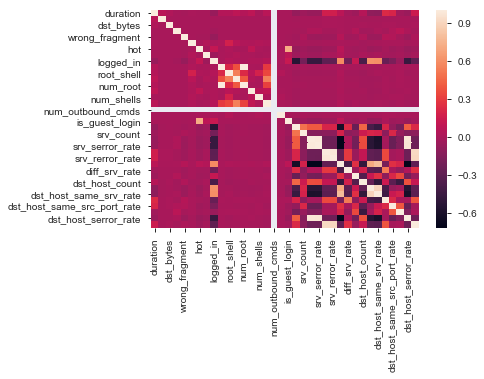

In [23]:
sns.heatmap(network.corr())

Dropping num_outbound_cmd as it has NaN correlation

In [24]:
network.drop(['num_outbound_cmds'],axis = 1, inplace = True)
network.head()

,duration,protocol_type,service,flag,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,...,dst_host_count,dst_host_srv_count,dst_host_same_srv_rate,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_rerror_rate,attack,Split
0,0,tcp,ftp_data,SF,491,0,0,0,0,0,...,150,25,0.17,0.03,0.17,0.00,0.00,0.05,normal,Train
1,0,udp,other,SF,146,0,0,0,0,0,...,255,1,0.00,0.60,0.88,0.00,0.00,0.00,normal,Train
2,0,tcp,private,S0,0,0,0,0,0,0,...,255,26,0.10,0.05,0.00,0.00,1.00,0.00,neptune,Train
3,0,tcp,http,SF,232,8153,0,0,0,0,...,30,255,1.00,0.00,0.03,0.04,0.03,0.00,normal,Train
4,0,tcp,http,SF,199,420,0,0,0,0,...,255,255,1.00,0.00,0.00,0.00,0.00,0.00,normal,Train


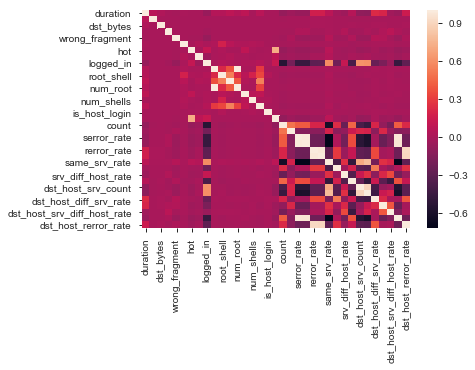

In [25]:
sns.heatmap(network.corr())

In [26]:
num_var = [key for key in dict(network.dtypes) if dict(network.dtypes)[key] in ['float32','float64','int32','int64']]
cat_var = [key for key in dict(network.dtypes) if dict(network.dtypes)[key] in ['object','O']]
print(num_var)
print(cat_var)

['duration', 'src_bytes', 'dst_bytes', 'land', 'wrong_fragment', 'urgent', 'hot', 'num_failed_logins', 'logged_in', 'num_compromised', 'root_shell', 'su_attempted', 'num_root', 'num_file_creations', 'num_shells', 'num_access_files', 'is_host_login', 'is_guest_login', 'count', 'srv_count', 'serror_rate', 'srv_serror_rate', 'rerror_rate', 'srv_rerror_rate', 'same_srv_rate', 'diff_srv_rate', 'srv_diff_host_rate', 'dst_host_count', 'dst_host_srv_count', 'dst_host_same_srv_rate', 'dst_host_diff_srv_rate', 'dst_host_same_src_port_rate', 'dst_host_srv_diff_host_rate', 'dst_host_serror_rate', 'dst_host_rerror_rate']
['protocol_type', 'service', 'flag', 'attack', 'Split']


In [27]:
network_num = network[num_var]
network_cat = network[cat_var]
network_num.head()

,duration,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,num_failed_logins,logged_in,num_compromised,...,diff_srv_rate,srv_diff_host_rate,dst_host_count,dst_host_srv_count,dst_host_same_srv_rate,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_rerror_rate
0,0,491,0,0,0,0,0,0,0,0,...,0.00,0.00,150,25,0.17,0.03,0.17,0.00,0.00,0.05
1,0,146,0,0,0,0,0,0,0,0,...,0.15,0.00,255,1,0.00,0.60,0.88,0.00,0.00,0.00
2,0,0,0,0,0,0,0,0,0,0,...,0.07,0.00,255,26,0.10,0.05,0.00,0.00,1.00,0.00
3,0,232,8153,0,0,0,0,0,1,0,...,0.00,0.00,30,255,1.00,0.00,0.03,0.04,0.03,0.00
4,0,199,420,0,0,0,0,0,1,0,...,0.00,0.09,255,255,1.00,0.00,0.00,0.00,0.00,0.00


In [28]:
def var_summary(x):
    return pd.Series([x.count(), x.isnull().sum(), x.sum(), x.mean(), x.median(), x.var(), x.std(), x.std()/x.mean(), x.min(), x.dropna().quantile(0.01), x.dropna().quantile(0.05), x.dropna().quantile(0.1), x.dropna().quantile(0.25), x.dropna().quantile(0.5), x.dropna().quantile(0.75), x.dropna().quantile(0.9), x.dropna().quantile(0.95), x.dropna().quantile(0.99), x.max()],
                     index = ['N','NMISS','SUM','MEAN','MEDIAN','VAR','STD','CV','MIN','P1','P5','P10','P25','P50','P75','P90','P95','P99','MAX'])

network_num.apply(var_summary).T

,N,NMISS,SUM,MEAN,MEDIAN,VAR,STD,CV,MIN,P1,P5,P10,P25,P50,P75,P90,P95,P99,MAX
duration,148517.0,0.0,4.110643e+07,276.779305,0.00,6.054961e+06,2.460683e+03,8.890416,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,9.00,8172.00,5.771500e+04
src_bytes,148517.0,0.0,5.974534e+09,40227.949299,44.00,2.926390e+13,5.409612e+06,134.473959,0.0,0.0,0.00,0.00,0.00,44.00,278.00,884.00,1594.20,54540.00,1.379964e+09
dst_bytes,148517.0,0.0,2.537985e+09,17088.853593,0.00,1.371610e+13,3.703525e+06,216.721664,0.0,0.0,0.00,0.00,0.00,0.00,571.00,3437.40,8314.00,25598.16,1.309937e+09
land,148517.0,0.0,3.200000e+01,0.000215,0.00,2.154186e-04,1.467714e-02,68.118922,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.000000e+00
wrong_fragment,148517.0,0.0,3.048000e+03,0.020523,0.00,5.763316e-02,2.400691e-01,11.697618,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,3.000000e+00
urgent,148517.0,0.0,3.000000e+01,0.000202,0.00,3.770229e-04,1.941708e-02,96.125543,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,3.000000e+00
hot,148517.0,0.0,2.812600e+04,0.189379,0.00,4.052813e+00,2.013160e+00,10.630323,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,2.00,1.010000e+02
num_failed_logins,148517.0,0.0,6.420000e+02,0.004323,0.00,5.219807e-03,7.224823e-02,16.713536,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,5.000000e+00
logged_in,148517.0,0.0,5.982100e+04,0.402789,0.00,2.405516e-01,4.904606e-01,1.217662,0.0,0.0,0.00,0.00,0.00,0.00,1.00,1.00,1.00,1.00,1.000000e+00
num_compromised,148517.0,0.0,3.788100e+04,0.255062,0.00,4.942340e+02,2.223137e+01,87.160769,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,7.479000e+03


In [29]:
def outlier_treatment(x):
    x = x.clip_upper(x.quantile(0.99))
    x = x.clip_lower(x.quantile(0.01))
    return x

network_num = network_num.apply(outlier_treatment)

C:\Users\ShubhamG\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: FutureWarning: clip_upper(threshold) is deprecated, use clip(upper=threshold) instead
  
C:\Users\ShubhamG\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: FutureWarning: clip_lower(threshold) is deprecated, use clip(lower=threshold) instead
  This is separate from the ipykernel package so we can avoid doing imports until


In [30]:
def var_summary(x):
    return pd.Series([x.count(), x.isnull().sum(), x.sum(), x.mean(), x.median(), x.var(), x.std(), x.min(), x.dropna().quantile(0.01), x.dropna().quantile(0.05), x.dropna().quantile(0.1), x.dropna().quantile(0.25), x.dropna().quantile(0.5), x.dropna().quantile(0.75), x.dropna().quantile(0.9), x.dropna().quantile(0.95), x.dropna().quantile(0.99), x.max()],
                     index = ['N','NMISS','SUM','MEAN','MEDIAN','VAR','STD','MIN','P1','P5','P10','P25','P50','P75','P90','P95','P99','MAX'])

network_num.apply(var_summary).T

,N,NMISS,SUM,MEAN,MEDIAN,VAR,STD,MIN,P1,P5,P10,P25,P50,P75,P90,P95,P99,MAX
duration,148517.0,0.0,2.183444e+07,147.016449,0.00,9.903342e+05,995.155352,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,9.00,8172.0000,8172.00
src_bytes,148517.0,0.0,1.945879e+08,1310.206475,44.00,5.254102e+07,7248.518266,0.0,0.0,0.00,0.00,0.00,44.00,278.00,884.00,1594.20,54540.0000,54540.00
dst_bytes,148517.0,0.0,2.012465e+08,1355.040391,0.00,1.455415e+07,3814.989900,0.0,0.0,0.00,0.00,0.00,0.00,571.00,3437.40,8314.00,25594.9344,25598.16
land,148517.0,0.0,0.000000e+00,0.000000,0.00,0.000000e+00,0.000000,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0000,0.00
wrong_fragment,148517.0,0.0,0.000000e+00,0.000000,0.00,0.000000e+00,0.000000,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0000,0.00
urgent,148517.0,0.0,0.000000e+00,0.000000,0.00,0.000000e+00,0.000000,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0000,0.00
hot,148517.0,0.0,6.897000e+03,0.046439,0.00,8.763170e-02,0.296027,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,2.0000,2.00
num_failed_logins,148517.0,0.0,0.000000e+00,0.000000,0.00,0.000000e+00,0.000000,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0000,0.00
logged_in,148517.0,0.0,5.982100e+04,0.402789,0.00,2.405516e-01,0.490461,0.0,0.0,0.00,0.00,0.00,0.00,1.00,1.00,1.00,1.0000,1.00
num_compromised,148517.0,0.0,1.655000e+03,0.011144,0.00,1.101940e-02,0.104973,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.0000,1.00


In [31]:
network_cat.head()

,protocol_type,service,flag,attack,Split
0,tcp,ftp_data,SF,normal,Train
1,udp,other,SF,normal,Train
2,tcp,private,S0,neptune,Train
3,tcp,http,SF,normal,Train
4,tcp,http,SF,normal,Train


In [32]:
print("Number of protocol type categories:")
print(len(network_cat['protocol_type'].unique()))
print("Number of service categories:")
print(len(network_cat['service'].unique()))
print("Number of flag categories")
print(len(network_cat['flag'].unique()))

Number of protocol type categories:
3
Number of service categories:
70
Number of flag categories
11


As there is high cardinality in each of the categorical variables, we need to create dummies for each. 

Total dummy variables = 3 + 70 + 11 = 84 dummy variables

In [33]:
def create_dummies(df,colname):
    col_dummies = pd.get_dummies(df[colname], prefix = colname, drop_first=True)
    df = pd.concat([df, col_dummies],axis = 1)
    df.drop([colname],axis = 1, inplace = True)
    return df

In [34]:
for features in ['service','flag','protocol_type']:
    network_cat[features] = network_cat[features].astype('category')
    network_cat = create_dummies(network_cat, features)

C:\Users\ShubhamG\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


In [38]:
network_cat.head()

,attack,Split,service_X11,service_Z39_50,service_aol,service_auth,service_bgp,service_courier,service_csnet_ns,service_ctf,...,flag_RSTR,flag_S0,flag_S1,flag_S2,flag_S3,flag_SF,flag_SH,protocol_type_tcp,protocol_type_udp,attack_class
0,normal,Train,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,1,0,0
1,normal,Train,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,1,0
2,neptune,Train,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,1,0,1
3,normal,Train,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,1,0,0
4,normal,Train,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,1,0,0


In [41]:
network_cat['attack'].unique()

array(['normal', 'neptune', 'warezclient', 'ipsweep', 'portsweep',
       'teardrop', 'nmap', 'satan', 'smurf', 'pod', 'back',
       'guess_passwd', 'ftp_write', 'multihop', 'rootkit',
       'buffer_overflow', 'imap', 'warezmaster', 'phf', 'land',
       'loadmodule', 'spy', 'perl', 'saint', 'mscan', 'apache2',
       'snmpgetattack', 'processtable', 'httptunnel', 'ps', 'snmpguess',
       'mailbomb', 'named', 'sendmail', 'xterm', 'worm', 'xlock',
       'xsnoop', 'sqlattack', 'udpstorm'], dtype=object)

In [42]:
network_cat['attack_class'] = np.where(network_cat['attack']!='normal',1,0)
network_cat.head()

,attack,Split,service_X11,service_Z39_50,service_aol,service_auth,service_bgp,service_courier,service_csnet_ns,service_ctf,...,flag_RSTR,flag_S0,flag_S1,flag_S2,flag_S3,flag_SF,flag_SH,protocol_type_tcp,protocol_type_udp,attack_class
0,normal,Train,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,1,0,0
1,normal,Train,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,1,0
2,neptune,Train,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,1,0,1
3,normal,Train,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,1,0,0
4,normal,Train,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,1,0,0


In [43]:
network_cat['attack_class'].value_counts()

0    77054
1    71463
Name: attack_class, dtype: int64

In [44]:
network_cat.drop(['attack'],axis = 1, inplace = True)
print(network_cat.columns)
network_cat.head()

Index(['Split', 'service_X11', 'service_Z39_50', 'service_aol', 'service_auth',
       'service_bgp', 'service_courier', 'service_csnet_ns', 'service_ctf',
       'service_daytime', 'service_discard', 'service_domain',
       'service_domain_u', 'service_echo', 'service_eco_i', 'service_ecr_i',
       'service_efs', 'service_exec', 'service_finger', 'service_ftp',
       'service_ftp_data', 'service_gopher', 'service_harvest',
       'service_hostnames', 'service_http', 'service_http_2784',
       'service_http_443', 'service_http_8001', 'service_imap4',
       'service_iso_tsap', 'service_klogin', 'service_kshell', 'service_ldap',
       'service_link', 'service_login', 'service_mtp', 'service_name',
       'service_netbios_dgm', 'service_netbios_ns', 'service_netbios_ssn',
       'service_netstat', 'service_nnsp', 'service_nntp', 'service_ntp_u',
       'service_other', 'service_pm_dump', 'service_pop_2', 'service_pop_3',
       'service_printer', 'service_private', 'service_red_i',


,Split,service_X11,service_Z39_50,service_aol,service_auth,service_bgp,service_courier,service_csnet_ns,service_ctf,service_daytime,...,flag_RSTR,flag_S0,flag_S1,flag_S2,flag_S3,flag_SF,flag_SH,protocol_type_tcp,protocol_type_udp,attack_class
0,Train,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,1,0,0
1,Train,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,1,0
2,Train,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,1,0,1
3,Train,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,1,0,0
4,Train,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,1,0,0


In [45]:
data = pd.concat([network_num,network_cat],axis=1)
data.head()

,duration,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,num_failed_logins,logged_in,num_compromised,...,flag_RSTR,flag_S0,flag_S1,flag_S2,flag_S3,flag_SF,flag_SH,protocol_type_tcp,protocol_type_udp,attack_class
0,0,491,0.0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,1,0,0
1,0,146,0.0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,1,0
2,0,0,0.0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,1,0,1
3,0,232,8153.0,0,0,0,0,0,1,0,...,0,0,0,0,0,1,0,1,0,0
4,0,199,420.0,0,0,0,0,0,1,0,...,0,0,0,0,0,1,0,1,0,0


In [46]:
data.corr()

,duration,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,num_failed_logins,logged_in,num_compromised,...,flag_RSTR,flag_S0,flag_S1,flag_S2,flag_S3,flag_SF,flag_SH,protocol_type_tcp,protocol_type_udp,attack_class
duration,1.000000,0.031754,0.022298,NaN,NaN,NaN,0.014879,NaN,-0.070226,0.048040,...,0.413059,-0.084887,-0.007541,0.006298,0.023342,-0.014423,-0.007118,-0.037575,0.073506,0.030004
src_bytes,0.031754,1.000000,0.113106,NaN,NaN,NaN,0.428118,NaN,0.156236,0.559997,...,0.173601,-0.103860,0.034170,0.010169,0.009027,0.079689,-0.008709,0.071365,-0.062912,0.042868
dst_bytes,0.022298,0.113106,1.000000,NaN,NaN,NaN,0.145471,NaN,0.417963,0.239904,...,-0.024563,-0.204092,0.128407,0.039919,-0.008491,0.258516,-0.017114,0.161729,-0.123734,-0.292957
land,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
wrong_fragment,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
urgent,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
hot,0.014879,0.428118,0.145471,NaN,NaN,NaN,1.000000,NaN,0.183832,0.548446,...,0.011554,-0.089772,0.006734,0.067270,-0.003984,0.106346,-0.006612,0.073860,-0.057545,0.053186
num_failed_logins,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
logged_in,-0.070226,0.156236,0.417963,NaN,NaN,NaN,0.183832,NaN,1.000000,0.129262,...,-0.052190,-0.471858,0.046788,0.028786,-0.021485,0.622415,-0.039570,0.386658,-0.301251,-0.664117
num_compromised,0.048040,0.559997,0.239904,NaN,NaN,NaN,0.548446,NaN,0.129262,1.000000,...,0.010141,-0.060997,0.017258,-0.001209,-0.003327,0.075320,-0.005115,0.049980,-0.038940,0.060164


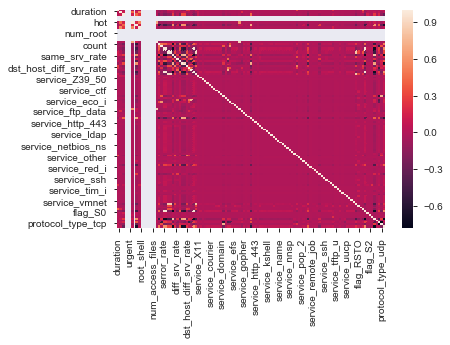

In [47]:
sns.heatmap(data.corr())

Dropping variables with NaN correlation

In [48]:
data.drop(['land','wrong_fragment','urgent','num_failed_logins', 'root_shell', 'su_attempted', 'num_root', 'num_file_creations', 'num_shells', 'num_access_files', 'is_host_login'], axis = 1, inplace = True)

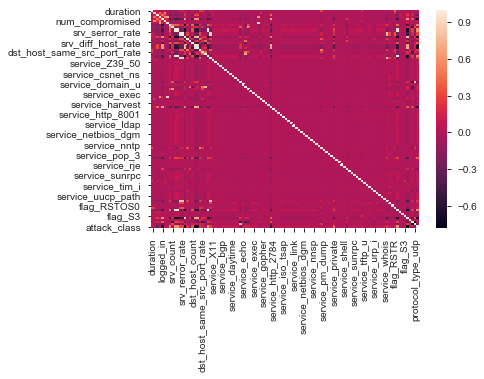

In [49]:
sns.heatmap(data.corr())

In [50]:
features = data.columns.difference(['attack_class'])
target = data['attack_class']
features

Index(['Split', 'count', 'diff_srv_rate', 'dst_bytes', 'dst_host_count',
       'dst_host_diff_srv_rate', 'dst_host_rerror_rate',
       'dst_host_same_src_port_rate', 'dst_host_same_srv_rate',
       'dst_host_serror_rate',
       ...
       'service_urp_i', 'service_uucp', 'service_uucp_path', 'service_vmnet',
       'service_whois', 'src_bytes', 'srv_count', 'srv_diff_host_rate',
       'srv_rerror_rate', 'srv_serror_rate'],
      dtype='object', length=106)

### Exploratory Data Analysis

#### Variable Reduction using Sommers' D

In [51]:
somersd_df = pd.DataFrame()
for variable in features:
    logreg = sm.logit(formula = str('attack_class ~ ')+str(variable), data = data)
    result = logreg.fit(method = 'bfgs')
    y_score = pd.DataFrame(result.predict())
    y_score.columns = ['Score']
    somers_d = 2*metrics.roc_auc_score(target,y_score) - 1
    temp = pd.DataFrame([variable,somers_d]).T
    temp.columns = ['Variable Name', 'Sommers D']
    somersd_df = pd.concat([somersd_df,temp],axis = 0)
    

Optimization terminated successfully.
         Current function value: 0.689656
         Iterations: 9
         Function evaluations: 11
         Gradient evaluations: 11
Optimization terminated successfully.
         Current function value: 0.516230
         Iterations: 10
         Function evaluations: 14
         Gradient evaluations: 14
Optimization terminated successfully.
         Current function value: 0.664631
         Iterations: 15
         Function evaluations: 16
         Gradient evaluations: 16


C:\Users\ShubhamG\Anaconda3\lib\site-packages\statsmodels\discrete\discrete_model.py:1724: RuntimeWarning: divide by zero encountered in log
  return np.sum(np.log(self.cdf(q*np.dot(X,params))))
C:\Users\ShubhamG\Anaconda3\lib\site-packages\statsmodels\discrete\discrete_model.py:1724: RuntimeWarning: divide by zero encountered in log
  return np.sum(np.log(self.cdf(q*np.dot(X,params))))


Optimization terminated successfully.
         Current function value: 0.602697
         Iterations: 11
         Function evaluations: 24
         Gradient evaluations: 15
Optimization terminated successfully.
         Current function value: 0.618243
         Iterations: 12
         Function evaluations: 15
         Gradient evaluations: 15
Optimization terminated successfully.
         Current function value: 0.656695
         Iterations: 13
         Function evaluations: 15
         Gradient evaluations: 15
Optimization terminated successfully.
         Current function value: 0.643208
         Iterations: 10
         Function evaluations: 12
         Gradient evaluations: 12
Optimization terminated successfully.
         Current function value: 0.689113
         Iterations: 11
         Function evaluations: 12
         Gradient evaluations: 12
Optimization terminated successfully.
         Current function value: 0.446227
         Iterations: 12
         Function evaluations: 13
  

C:\Users\ShubhamG\Anaconda3\lib\site-packages\statsmodels\discrete\discrete_model.py:1724: RuntimeWarning: divide by zero encountered in log
  return np.sum(np.log(self.cdf(q*np.dot(X,params))))
C:\Users\ShubhamG\Anaconda3\lib\site-packages\statsmodels\discrete\discrete_model.py:1724: RuntimeWarning: divide by zero encountered in log
  return np.sum(np.log(self.cdf(q*np.dot(X,params))))
C:\Users\ShubhamG\Anaconda3\lib\site-packages\statsmodels\base\model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.693147
         Iterations: 0
         Function evaluations: 16
         Gradient evaluations: 4
Optimization terminated successfully.
         Current function value: 0.664892
         Iterations: 10
         Function evaluations: 12
         Gradient evaluations: 12
Optimization terminated successfully.
         Current function value: 0.685882
         Iterations: 17
         Function evaluations: 18
         Gradient evaluations: 18
Optimization terminated successfully.
         Current function value: 0.691960
         Iterations: 17
         Function evaluations: 21
         Gradient evaluations: 21
Optimization terminated successfully.
         Current function value: 0.681937
         Iterations: 17
         Function evaluations: 18
         Gradient evaluations: 18
Optimization terminated successfully.
         Current function value: 0.480695
         Iterations: 14
         Function evaluations: 16
         Gradient evaluations: 16
Optimiza

Optimization terminated successfully.
         Current function value: 0.688805
         Iterations: 26
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.690197
         Iterations: 24
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.690845
         Iterations: 25
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.690321
         Iterations: 24
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.689940
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
Optimization terminated successfully.
         Current function value: 0.690177
         Iterations: 24
         Function evaluations: 27
  

C:\Users\ShubhamG\Anaconda3\lib\site-packages\statsmodels\discrete\discrete_model.py:1724: RuntimeWarning: divide by zero encountered in log
  return np.sum(np.log(self.cdf(q*np.dot(X,params))))
C:\Users\ShubhamG\Anaconda3\lib\site-packages\statsmodels\discrete\discrete_model.py:1724: RuntimeWarning: divide by zero encountered in log
  return np.sum(np.log(self.cdf(q*np.dot(X,params))))


Optimization terminated successfully.
         Current function value: 0.691512
         Iterations: 9
         Function evaluations: 23
         Gradient evaluations: 13
Optimization terminated successfully.
         Current function value: 0.692324
         Iterations: 8
         Function evaluations: 11
         Gradient evaluations: 11
Optimization terminated successfully.
         Current function value: 0.685835
         Iterations: 12
         Function evaluations: 13
         Gradient evaluations: 13
Optimization terminated successfully.
         Current function value: 0.643972
         Iterations: 10
         Function evaluations: 12
         Gradient evaluations: 12
Optimization terminated successfully.
         Current function value: 0.483408
         Iterations: 13
         Function evaluations: 15
         Gradient evaluations: 15


In [52]:
somersd_df

,Variable Name,Sommers D
0,Split,0.0535469
0,count,0.56517
0,diff_srv_rate,0.646419
0,dst_bytes,0.784209
0,dst_host_count,0.408474
0,dst_host_diff_srv_rate,0.647118
0,dst_host_rerror_rate,0.242973
0,dst_host_same_src_port_rate,-0.270385
0,dst_host_same_srv_rate,0.711397
0,dst_host_serror_rate,0.558452


Sommers' D tells the relationship between the independent variable and the dependent variable. So variables with higher Sommers'D can be useful for the classification model.  

In [53]:
somersd_df.sort_values(by="Sommers D", ascending = False)

,Variable Name,Sommers D
0,dst_bytes,0.784209
0,dst_host_srv_count,0.760179
0,flag_SF,0.712021
0,dst_host_same_srv_rate,0.711397
0,same_srv_rate,0.696737
0,logged_in,0.651907
0,dst_host_diff_srv_rate,0.647118
0,diff_srv_rate,0.646419
0,count,0.56517
0,dst_host_serror_rate,0.558452


In [54]:
somersd_df = somersd_df[somersd_df['Sommers D']>0.2]
somersd_df

,Variable Name,Sommers D
0,count,0.56517
0,diff_srv_rate,0.646419
0,dst_bytes,0.784209
0,dst_host_count,0.408474
0,dst_host_diff_srv_rate,0.647118
0,dst_host_rerror_rate,0.242973
0,dst_host_same_srv_rate,0.711397
0,dst_host_serror_rate,0.558452
0,dst_host_srv_count,0.760179
0,flag_S0,0.5063


In [55]:
data_filter = data[somersd_df['Variable Name']]

In [56]:
data_filter['attack'] = data['attack_class']

C:\Users\ShubhamG\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


In [57]:
data_filter.head()

,count,diff_srv_rate,dst_bytes,dst_host_count,dst_host_diff_srv_rate,dst_host_rerror_rate,dst_host_same_srv_rate,dst_host_serror_rate,dst_host_srv_count,flag_S0,...,logged_in,rerror_rate,same_srv_rate,serror_rate,service_http,service_private,srv_diff_host_rate,srv_rerror_rate,srv_serror_rate,attack
0,2,0.00,0.0,150,0.03,0.05,0.17,0.00,25,0,...,0,0.0,1.00,0.0,0,0,0.00,0.0,0.0,0
1,13,0.15,0.0,255,0.60,0.00,0.00,0.00,1,0,...,0,0.0,0.08,0.0,0,0,0.00,0.0,0.0,0
2,123,0.07,0.0,255,0.05,0.00,0.10,1.00,26,1,...,0,0.0,0.05,1.0,0,1,0.00,0.0,1.0,1
3,5,0.00,8153.0,30,0.00,0.00,1.00,0.03,255,0,...,1,0.0,1.00,0.2,1,0,0.00,0.0,0.2,0
4,30,0.00,420.0,255,0.00,0.00,1.00,0.00,255,0,...,1,0.0,1.00,0.0,1,0,0.09,0.0,0.0,0


In [58]:
features = '+'.join(somersd_df['Variable Name'])
features

'count+diff_srv_rate+dst_bytes+dst_host_count+dst_host_diff_srv_rate+dst_host_rerror_rate+dst_host_same_srv_rate+dst_host_serror_rate+dst_host_srv_count+flag_S0+flag_SF+logged_in+rerror_rate+same_srv_rate+serror_rate+service_http+service_private+srv_diff_host_rate+srv_rerror_rate+srv_serror_rate'

### Variable Inflation Factor

In [59]:
a,b = dmatrices(formula_like='attack ~ count+diff_srv_rate+dst_bytes+dst_host_count+dst_host_diff_srv_rate+dst_host_rerror_rate+dst_host_same_srv_rate+dst_host_serror_rate+dst_host_srv_count+flag_S0+flag_SF+logged_in+rerror_rate+same_srv_rate+serror_rate+service_http+service_private+srv_diff_host_rate+srv_rerror_rate+srv_serror_rate', data = data_filter, return_type = 'dataframe')

vif = pd.DataFrame()
vif['VIF Factor'] = [variance_inflation_factor(b.values, i) for i in range(b.shape[1])]
vif['Features'] = b.columns
vif

,VIF Factor,Features
0,340.186390,Intercept
1,2.044749,count
2,2.054970,diff_srv_rate
3,1.278568,dst_bytes
4,1.946639,dst_host_count
5,2.204051,dst_host_diff_srv_rate
6,7.694903,dst_host_rerror_rate
7,10.594700,dst_host_same_srv_rate
8,26.936105,dst_host_serror_rate
9,8.172742,dst_host_srv_count


In [60]:
a,b = dmatrices(formula_like='attack ~ count+diff_srv_rate+dst_bytes+dst_host_count+dst_host_diff_srv_rate+dst_host_rerror_rate+dst_host_srv_count+flag_SF+logged_in+same_srv_rate+service_http+service_private+srv_diff_host_rate+srv_rerror_rate', data = data_filter, return_type = 'dataframe')
#+dst_host_rerror_rate
vif = pd.DataFrame()
vif['VIF Factor'] = [variance_inflation_factor(b.values, i) for i in range(b.shape[1])]
vif['Features'] = b.columns
vif

,VIF Factor,Features
0,21.747180,Intercept
1,2.012346,count
2,1.959913,diff_srv_rate
3,1.268928,dst_bytes
4,1.598207,dst_host_count
5,1.989107,dst_host_diff_srv_rate
6,6.420973,dst_host_rerror_rate
7,4.560552,dst_host_srv_count
8,5.406747,flag_SF
9,3.048102,logged_in


In [61]:
vif = vif[vif['VIF Factor']<8]
vif

,VIF Factor,Features
1,2.012346,count
2,1.959913,diff_srv_rate
3,1.268928,dst_bytes
4,1.598207,dst_host_count
5,1.989107,dst_host_diff_srv_rate
6,6.420973,dst_host_rerror_rate
7,4.560552,dst_host_srv_count
8,5.406747,flag_SF
9,3.048102,logged_in
10,6.793215,same_srv_rate


In [62]:
features_new = "+".join(vif['Features'])
features_new

'count+diff_srv_rate+dst_bytes+dst_host_count+dst_host_diff_srv_rate+dst_host_rerror_rate+dst_host_srv_count+flag_SF+logged_in+same_srv_rate+service_http+service_private+srv_diff_host_rate+srv_rerror_rate'

In [63]:
data_filter_new = data_filter[vif['Features']]

In [64]:
data_filter_new['attack_new'] = data_filter['attack']
data_filter_new.head()

C:\Users\ShubhamG\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


,count,diff_srv_rate,dst_bytes,dst_host_count,dst_host_diff_srv_rate,dst_host_rerror_rate,dst_host_srv_count,flag_SF,logged_in,same_srv_rate,service_http,service_private,srv_diff_host_rate,srv_rerror_rate,attack_new
0,2,0.00,0.0,150,0.03,0.05,25,1,0,1.00,0,0,0.00,0.0,0
1,13,0.15,0.0,255,0.60,0.00,1,1,0,0.08,0,0,0.00,0.0,0
2,123,0.07,0.0,255,0.05,0.00,26,0,0,0.05,0,1,0.00,0.0,1
3,5,0.00,8153.0,30,0.00,0.00,255,1,1,1.00,1,0,0.00,0.0,0
4,30,0.00,420.0,255,0.00,0.00,255,1,1,1.00,1,0,0.09,0.0,0


In [66]:
data_filter_new['Split'] = data['Split']

C:\Users\ShubhamG\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


In [67]:
data_filter_new.head()

,count,diff_srv_rate,dst_bytes,dst_host_count,dst_host_diff_srv_rate,dst_host_rerror_rate,dst_host_srv_count,flag_SF,logged_in,same_srv_rate,service_http,service_private,srv_diff_host_rate,srv_rerror_rate,attack_new,Split
0,2,0.00,0.0,150,0.03,0.05,25,1,0,1.00,0,0,0.00,0.0,0,Train
1,13,0.15,0.0,255,0.60,0.00,1,1,0,0.08,0,0,0.00,0.0,0,Train
2,123,0.07,0.0,255,0.05,0.00,26,0,0,0.05,0,1,0.00,0.0,1,Train
3,5,0.00,8153.0,30,0.00,0.00,255,1,1,1.00,1,0,0.00,0.0,0,Train
4,30,0.00,420.0,255,0.00,0.00,255,1,1,1.00,1,0,0.09,0.0,0,Train


In [68]:
data_filter_new.shape

(148517, 16)

In [69]:
pandas_profiling.ProfileReport(data_filter_new)

#### Train and Test Split

In [70]:
train = data_filter_new.loc[data_filter_new['Split']=='Train']
test = data_filter_new.loc[data_filter_new['Split']=='Test']

## Building logistic regression

In [71]:
logreg = sm.logit(formula = 'attack_new ~'+features_new, data = data_filter_new)
result = logreg.fit()

Optimization terminated successfully.
         Current function value: 0.247558
         Iterations 8


In [72]:
print(result.summary2())

                            Results: Logit
Model:                 Logit             Pseudo R-squared:  0.642      
Dependent Variable:    attack_new        AIC:               73563.2745 
Date:                  2020-03-28 09:14  BIC:               73711.9013 
No. Observations:      148517            Log-Likelihood:    -36767.    
Df Model:              14                LL-Null:           -1.0284e+05
Df Residuals:          148502            LLR p-value:       0.0000     
Converged:             1.0000            Scale:             1.0000     
No. Iterations:        8.0000                                          
-----------------------------------------------------------------------
                        Coef.  Std.Err.    z     P>|z|   [0.025  0.975]
-----------------------------------------------------------------------
Intercept               3.9156   0.0600  65.2687 0.0000  3.7980  4.0332
count                   0.0048   0.0001  49.4557 0.0000  0.0046  0.0050
diff_srv_rate        

In [89]:
logreg = sm.logit(formula = 'attack_new ~ count+diff_srv_rate+dst_bytes+dst_host_diff_srv_rate+dst_host_serror_rate+dst_host_srv_count+logged_in+rerror_rate+same_srv_rate+service_http+service_private+srv_diff_host_rate', data = data_filter_new)
result = logreg.fit()
print(result.summary2())

Optimization terminated successfully.
         Current function value: 0.248745
         Iterations 9
                            Results: Logit
Model:                 Logit             Pseudo R-squared:  0.641      
Dependent Variable:    attack_new        AIC:               73911.8682 
Date:                  2020-02-29 18:01  BIC:               74040.6781 
No. Observations:      148517            Log-Likelihood:    -36943.    
Df Model:              12                LL-Null:           -1.0284e+05
Df Residuals:          148504            LLR p-value:       0.0000     
Converged:             1.0000            Scale:             1.0000     
No. Iterations:        9.0000                                          
-----------------------------------------------------------------------
                        Coef.  Std.Err.    z     P>|z|   [0.025  0.975]
-----------------------------------------------------------------------
Intercept               0.9520   0.0549  17.3562 0.0000  0.8445

In [73]:
train_gini = 2*metrics.roc_auc_score(train['attack_new'],result.predict(train)) - 1
print("The Gini index score for the Training model is:", train_gini)

test_gini = 2*metrics.roc_auc_score(test['attack_new'],result.predict(test)) - 1
print("The Gini index score for the Test model is: {}".format(test_gini))

The Gini index score for the Training model is: 0.948739679056771
The Gini index score for the Test model is: 0.7952489375749627


In [74]:
train_auc = metrics.roc_auc_score(train['attack_new'],result.predict(train))
print("The AUC for the model built on Train set is: {}".format(train_auc))
test_auc = metrics.roc_auc_score(test['attack_new'],result.predict(test))
print("The AUC for the model built on Test set is: {}".format(test_auc))

The AUC for the model built on Train set is: 0.9743698395283855
The AUC for the model built on Test set is: 0.8976244687874814


In [75]:
## Intuition behind ROC curve - predicted probability as a tool for separating the '1's and '0's
train_pred_prob = pd.DataFrame(result.predict(train))
train_pred_prob.columns = ['prob']
train_actual = train['attack_new']
# making a DataFrame with actual and prob columns
train_predict = pd.concat([train_actual,train_pred_prob],axis = 1)
train_predict.columns = ['actual','prob']
train_predict.head()

,actual,prob
0,0,0.377691
1,0,0.593396
2,1,0.997009
3,0,0.013833
4,0,0.018026


In [76]:
## Intuition behind ROC curve - predicted probability as a tool for separating the '1's and '0's
test_pred_prob = pd.DataFrame(result.predict(test))
test_pred_prob.columns = ['prob']
test_actual = test['attack_new']
# making a DataFrame with actual and prob columns
test_predict = pd.concat([test_actual,test_pred_prob],axis = 1)
test_predict.columns = ['actual','prob']
test_predict.head()

,actual,prob
0,1,0.997303
1,1,0.996193
2,0,0.270579
3,1,0.587991
4,1,0.940909


In [77]:
roc_df = pd.DataFrame()
train_temp = train_predict.copy()

for cut_off in np.linspace(0,1,100):
    train_temp['cut_off'] = cut_off
    train_temp['predicted'] = train_temp['prob'].apply(lambda x :0.0 if x < cut_off else 1.0)
    train_temp['tp'] = train_temp.apply(lambda x: 1.0 if x['actual'] == 1.0 and x['predicted'] == 1 else 0.0, axis = 1)
    train_temp['fp'] = train_temp.apply(lambda x: 1.0 if x['actual'] == 0.0 and x['predicted'] == 1 else 0.0, axis = 1)
    train_temp['tn'] = train_temp.apply(lambda x: 1.0 if x['actual'] == 0.0 and x['predicted'] == 0 else 0.0, axis = 1)
    train_temp['fn'] = train_temp.apply(lambda x: 1.0 if x['actual'] == 1.0 and x['predicted'] == 0 else 0.0, axis = 1)
    sensitivity = train_temp['tp'].sum()/(train_temp['tp'].sum()+train_temp['fn'].sum())
    specificity = train_temp['tn'].sum()/(train_temp['tn'].sum()+train_temp['fp'].sum())
    accuracy = (train_temp['tn'].sum()+train_temp['tp'].sum())/(train_temp['tp'].sum()+train_temp['fn'].sum()+train_temp['tn'].sum()+train_temp['fp'].sum())
    roc_table = pd.DataFrame([cut_off,sensitivity,specificity,accuracy]).T
    roc_table.columns = ['Cut_off','Sensitivity','Specificity','Accuracy']
    roc_df = pd.concat([roc_df,roc_table],axis = 0)
    

In [78]:
roc_df

,Cut_off,Sensitivity,Specificity,Accuracy
0,0.000000,1.000000,0.000000,0.465417
0,0.010101,0.999829,0.000282,0.465489
0,0.020202,0.996776,0.420549,0.688735
0,0.030303,0.993485,0.483822,0.721028
0,0.040404,0.991932,0.497409,0.727569
0,0.050505,0.989886,0.506467,0.731458
0,0.060606,0.988095,0.513461,0.734364
0,0.070707,0.986475,0.519980,0.737094
0,0.080808,0.985775,0.526142,0.740063
0,0.090909,0.985366,0.533433,0.743770


In [79]:
roc_df['total'] = roc_df['Sensitivity']+roc_df['Specificity']
# Cut-off based on max(specificity + sensitivity) 
roc_df[roc_df['total'] == roc_df['total'].max()]

,Cut_off,Sensitivity,Specificity,Accuracy,total
0,0.525253,0.905049,0.957427,0.933049,1.862476


Chosen highest cut-off is 0.525 based on max(specificity + sensitivity)

In [80]:
train_predict['predicted'] = train_predict['prob'].apply(lambda x: 1 if x>0.525 else 0)
test_predict['predicted'] = test_predict['prob'].apply(lambda x: 1 if x>0.525 else 0)

In [81]:
pd.crosstab(train_predict['actual'],train_predict['predicted'],margins = True)

predicted,0,1,All
actual,,,
0,64473,2870,67343
1,5567,53063,58630
All,70040,55933,125973


In [82]:
pd.crosstab(test_predict['actual'],test_predict['predicted'],margins = True)

predicted,0,1,All
actual,,,
0,8940,771,9711
1,5287,7546,12833
All,14227,8317,22544


In [83]:
print("The Overall Accuracy for the Train Data Set is:", metrics.roc_auc_score(train_predict.actual,train_predict.predicted))
print("The Overall Accuracy for the Test Data Set is:", metrics.roc_auc_score(test_predict.actual,test_predict.predicted))

The Overall Accuracy for the Train Data Set is: 0.9312154829625275
The Overall Accuracy for the Test Data Set is: 0.7543103860213646


#### Precision - 
Precision is the ratio of correctly predicted positive observations to the total predicted positive observations.  High precision relates to the low false positive rate.

Precision = TP/TP+FP

#### Recall (Sensitivity) - 
Recall is the ratio of correctly predicted positive observations to the all observations in actual class. 

Recall = TP/TP+FN

#### F1 score - 
F1 Score is the weighted average of Precision and Recall. Therefore, this score takes both false positives and false negatives into account. Intuitively it is not as easy to understand as accuracy, but F1 is usually more useful than accuracy, especially if you have an uneven class distribution. Accuracy works best if false positives and false negatives have similar cost. If the cost of false positives and false negatives are very different, it’s better to look at both Precision and Recall.

F1 Score = 2*(Recall * Precision) / (Recall + Precision)

In [84]:
print(metrics.classification_report(train_predict.actual,train_predict.predicted))

              precision    recall  f1-score   support

           0       0.92      0.96      0.94     67343
           1       0.95      0.91      0.93     58630

   micro avg       0.93      0.93      0.93    125973
   macro avg       0.93      0.93      0.93    125973
weighted avg       0.93      0.93      0.93    125973



The normal attack has a value of 0. 

A precision of 0.92 is very good

Recall is 0.96 which is much greater than 0.5. Very Good

F-1 score is also good

In [85]:
print(metrics.classification_report(test_predict.actual,test_predict.predicted))

              precision    recall  f1-score   support

           0       0.63      0.92      0.75      9711
           1       0.91      0.59      0.71     12833

   micro avg       0.73      0.73      0.73     22544
   macro avg       0.77      0.75      0.73     22544
weighted avg       0.79      0.73      0.73     22544



#### Test Report

##### Precision 
0.63 for normal attacks means it is unable to properly identify the attacks. 

##### Recall
Recall of 0.92 is good as total positive to the overall.

##### F-1 Score
The weighted average of Precision and Recall gives us a value of 0.75

## Naive Bayes

In [106]:
data_dtm = data_filter_new.copy()
data_dtm.head()

,count,diff_srv_rate,dst_bytes,dst_host_count,dst_host_diff_srv_rate,dst_host_rerror_rate,dst_host_srv_count,flag_SF,logged_in,same_srv_rate,service_http,service_private,srv_diff_host_rate,srv_rerror_rate,attack_new,Split
0,2,0.00,0.0,150,0.03,0.05,25,1,0,1.00,0,0,0.00,0.0,0,Train
1,13,0.15,0.0,255,0.60,0.00,1,1,0,0.08,0,0,0.00,0.0,0,Train
2,123,0.07,0.0,255,0.05,0.00,26,0,0,0.05,0,1,0.00,0.0,1,Train
3,5,0.00,8153.0,30,0.00,0.00,255,1,1,1.00,1,0,0.00,0.0,0,Train
4,30,0.00,420.0,255,0.00,0.00,255,1,1,1.00,1,0,0.09,0.0,0,Train


In [107]:
feature_columns = data_dtm.columns.difference(['attack_new','Split'])
feature_columns

Index(['count', 'diff_srv_rate', 'dst_bytes', 'dst_host_count',
       'dst_host_diff_srv_rate', 'dst_host_rerror_rate', 'dst_host_srv_count',
       'flag_SF', 'logged_in', 'same_srv_rate', 'service_http',
       'service_private', 'srv_diff_host_rate', 'srv_rerror_rate'],
      dtype='object')

In [108]:
train_X, test_X, train_y, test_y = train_test_split(data_dtm[feature_columns],data_dtm['attack_new'],test_size = 0.2, random_state = 234)

In [138]:
nb_clf = GaussianNB()
nb_clf.fit(train[feature_columns],train['attack_new'])

GaussianNB(priors=None, var_smoothing=1e-09)

In [139]:
metrics.accuracy_score(test['attack_new'],nb_clf.predict(test[feature_columns]))

0.7462295954577715

In [140]:
auc_score = metrics.roc_auc_score(test['attack_new'],nb_clf.predict(test[feature_columns]))
auc_score

0.7642464793507991

## Building a Decision Tree Model

In [120]:
clf_tree = DecisionTreeClassifier(max_depth = 4,random_state = 12)
clf_tree = clf_tree.fit(train[feature_columns],train['attack_new'])

In [121]:
clf_tree.predict_proba(train[feature_columns])

array([[7.41778976e-01, 2.58221024e-01],
       [7.41778976e-01, 2.58221024e-01],
       [7.26942299e-04, 9.99273058e-01],
       ...,
       [9.04775360e-01, 9.52246397e-02],
       [7.26942299e-04, 9.99273058e-01],
       [7.41778976e-01, 2.58221024e-01]])

In [122]:
pd.DataFrame(clf_tree.predict_proba(train[feature_columns])).head()

,0,1
0,0.741779,0.258221
1,0.741779,0.258221
2,0.000727,0.999273
3,0.999816,0.000184
4,0.999816,0.000184


In [123]:
pd.DataFrame(clf_tree.predict_proba(train[feature_columns]))[1]

0         0.258221
1         0.258221
2         0.999273
3         0.000184
4         0.000184
5         0.999273
6         0.999273
7         0.999273
8         0.999273
9         0.999273
10        0.999273
11        0.999273
12        0.000184
13        0.813853
14        0.999273
15        0.999273
16        0.000184
17        0.813853
18        0.095225
19        0.000184
20        0.999273
21        0.999273
22        0.000184
23        0.007391
24        0.999273
25        0.011321
26        0.999273
27        0.095225
28        0.000184
29        0.000184
30        0.813853
31        0.999273
32        0.000184
33        0.988229
34        0.000184
35        0.007391
36        0.000184
37        0.999273
38        0.000184
39        0.999273
40        0.999273
41        0.999273
42        0.000184
43        0.007391
44        0.000184
45        0.999273
46        0.999273
47        0.000184
48        0.813853
49        0.999273
50        0.000184
51        0.999273
52        0.

In [124]:
train_pred_tree = pd.DataFrame({'actual':train['attack_new'],
                              'predicted':clf_tree.predict(train[feature_columns])})

In [125]:
train_pred_tree.head()

,actual,predicted
0,0,0
1,0,0
2,1,1
3,0,0
4,0,0


In [126]:
test_pred_tree = pd.DataFrame({'actual':test['attack_new'],
                              'predicted':clf_tree.predict(test[feature_columns])})

In [127]:
test_pred_tree.head(10)

,actual,predicted
0,1,1
1,1,1
2,0,0
3,1,1
4,1,0
5,0,0
6,0,0
7,1,0
8,0,0
9,1,0


In [128]:
metrics.accuracy_score(train_pred_tree.actual,train_pred_tree.predicted)

0.9574432616513062

In [129]:
metrics.accuracy_score(test_pred_tree.actual, test_pred_tree.predicted)

0.7768364088005678

In [130]:
train_y.value_counts()

0    61624
1    57189
Name: attack_new, dtype: int64

In [131]:
predict_proba_df = pd.DataFrame(clf_tree.predict_proba(train[feature_columns]))

In [134]:
predict_proba_df.columns = ['Normal','Attack']
predict_proba_df.head()

,Normal,Attack
0,0.741779,0.258221
1,0.741779,0.258221
2,0.000727,0.999273
3,0.999816,0.000184
4,0.999816,0.000184


In [135]:
metrics.roc_auc_score(train['attack_new'],predict_proba_df.Attack)

0.991231987222191

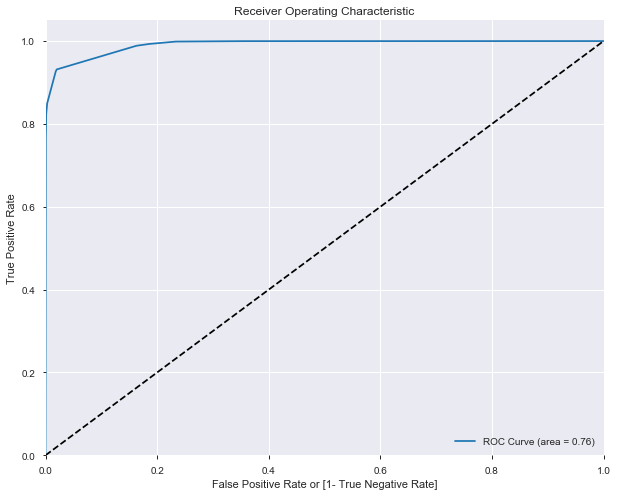

In [141]:
fpr, tpr, thresholds = metrics.roc_curve(train['attack_new'],
                                        predict_proba_df.Attack,
                                        drop_intermediate=False)

plt.figure(figsize=(10,8))
plt.plot(fpr,tpr, label = 'ROC Curve (area = %0.2f)' % auc_score)
plt.plot([0,1],[0,1],'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate or [1- True Negative Rate]')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc = 'lower right')
plt.show()

**Fine Tuning the Parameters**

In [143]:
param_grid = {'max_depth':np.arange(6,13),
             'max_features':np.arange(1,11)}

In [144]:
tree = GridSearchCV(DecisionTreeClassifier(), param_grid, cv = 6)
tree.fit(train[feature_columns],train['attack_new'])

GridSearchCV(cv=6, error_score='raise-deprecating',
       estimator=DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best'),
       fit_params=None, iid='warn', n_jobs=None,
       param_grid={'max_depth': array([ 6,  7,  8,  9, 10, 11, 12]), 'max_features': array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10])},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring=None, verbose=0)

In [145]:
tree.best_score_

0.993395410127567

In [146]:
tree.best_estimator_

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=12,
            max_features=10, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')

In [147]:
tree.best_params_

{'max_depth': 12, 'max_features': 10}

In [148]:
train_pred = tree.predict(train[feature_columns])

In [149]:
print(metrics.classification_report(train['attack_new'],train_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     67343
           1       1.00      1.00      1.00     58630

   micro avg       1.00      1.00      1.00    125973
   macro avg       1.00      1.00      1.00    125973
weighted avg       1.00      1.00      1.00    125973



In [150]:
test_pred = tree.predict(test[feature_columns])

In [151]:
print(metrics.classification_report(test['attack_new'],test_pred))

              precision    recall  f1-score   support

           0       0.66      0.97      0.79      9711
           1       0.96      0.62      0.76     12833

   micro avg       0.77      0.77      0.77     22544
   macro avg       0.81      0.80      0.77     22544
weighted avg       0.83      0.77      0.77     22544



### Finding best parameters using GridSearch

In [152]:
train_y.value_counts()

0    61624
1    57189
Name: attack_new, dtype: int64

In [153]:
test_y.value_counts()

0    15430
1    14274
Name: attack_new, dtype: int64

Text(0.5, 12.5, 'Predicted Label')

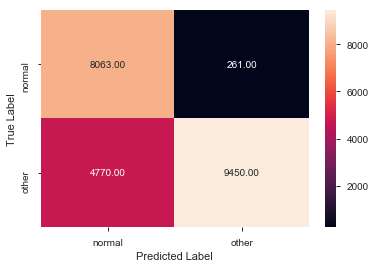

In [155]:
tree_cm = metrics.confusion_matrix(test_pred_tree.predicted, test_pred_tree.actual, [1,0])
sns.heatmap(tree_cm, annot = True, fmt = '.2f', xticklabels = ['normal','other'], yticklabels = ['normal','other'])
plt.ylabel("True Label")
plt.xlabel("Predicted Label")

In [156]:
print(metrics.classification_report(train_pred_tree.actual,train_pred_tree.predicted))

              precision    recall  f1-score   support

           0       0.94      0.98      0.96     67343
           1       0.98      0.93      0.95     58630

   micro avg       0.96      0.96      0.96    125973
   macro avg       0.96      0.96      0.96    125973
weighted avg       0.96      0.96      0.96    125973



In [157]:
print(metrics.classification_report(test_pred_tree.actual,test_pred_tree.predicted))

              precision    recall  f1-score   support

           0       0.66      0.97      0.79      9711
           1       0.97      0.63      0.76     12833

   micro avg       0.78      0.78      0.78     22544
   macro avg       0.82      0.80      0.78     22544
weighted avg       0.84      0.78      0.77     22544



We see that the precision and recall has improved a lot while using Decision Trees, but it might also be due to overfitting, so we need to fine tune the parameters

#### Fine Tuning the Parameters

In [158]:
pGrid = {'max_depth': [4,5,6,7,8],
        'min_samples_leaf':[20,40,60],
        'min_samples_split':[50,75,100]}

gscv_dt = GridSearchCV(estimator = DecisionTreeClassifier(),param_grid=pGrid,cv = 6, scoring='recall',verbose = True)

In [159]:
gscv_dt.fit(train_X, train_y)

Fitting 6 folds for each of 45 candidates, totalling 270 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 270 out of 270 | elapsed:  1.2min finished


GridSearchCV(cv=6, error_score='raise-deprecating',
       estimator=DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best'),
       fit_params=None, iid='warn', n_jobs=None,
       param_grid={'max_depth': [4, 5, 6, 7, 8], 'min_samples_leaf': [20, 40, 60], 'min_samples_split': [50, 75, 100]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring='recall', verbose=True)

In [160]:
gscv_dt.best_params_

{'max_depth': 8, 'min_samples_leaf': 20, 'min_samples_split': 50}

In [161]:
gscv_dt.best_estimator_

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=8,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=20, min_samples_split=50,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')

In [162]:
print(metrics.accuracy_score(train_y,gscv_dt.best_estimator_.predict(train_X)))

0.9822746669135533


In [163]:
train_pred_dt_final = gscv_dt.predict(train_X)

In [164]:
print(metrics.classification_report(train_y, train_pred_dt_final))

              precision    recall  f1-score   support

           0       0.98      0.98      0.98     61624
           1       0.98      0.98      0.98     57189

   micro avg       0.98      0.98      0.98    118813
   macro avg       0.98      0.98      0.98    118813
weighted avg       0.98      0.98      0.98    118813



In [165]:
test_pred_dt_final = gscv_dt.predict(test_X)

In [166]:
print(metrics.classification_report(test_y, test_pred_dt_final))

              precision    recall  f1-score   support

           0       0.98      0.98      0.98     15430
           1       0.98      0.98      0.98     14274

   micro avg       0.98      0.98      0.98     29704
   macro avg       0.98      0.98      0.98     29704
weighted avg       0.98      0.98      0.98     29704



### Building Final Decision Tree Model

In [167]:
clf_tree = DecisionTreeClassifier(max_depth=8, random_state = 123)
clf_tree.fit(train_X, train_y)

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=8,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=123,
            splitter='best')

### Feature Importance

In [168]:
train_X.columns

Index(['count', 'diff_srv_rate', 'dst_bytes', 'dst_host_count',
       'dst_host_diff_srv_rate', 'dst_host_rerror_rate', 'dst_host_srv_count',
       'flag_SF', 'logged_in', 'same_srv_rate', 'service_http',
       'service_private', 'srv_diff_host_rate', 'srv_rerror_rate'],
      dtype='object')

In [169]:
clf_tree.feature_importances_

array([0.1003067 , 0.00177019, 0.67346566, 0.04589827, 0.03168339,
       0.05203602, 0.01131604, 0.02337554, 0.00337947, 0.00116067,
       0.02615608, 0.02522357, 0.0026158 , 0.0016126 ])

In [170]:
list(zip(train_X.columns, clf_tree.feature_importances_))

[('count', 0.10030669579498824),
 ('diff_srv_rate', 0.0017701852182531502),
 ('dst_bytes', 0.6734656639505269),
 ('dst_host_count', 0.04589826775554407),
 ('dst_host_diff_srv_rate', 0.03168339098651876),
 ('dst_host_rerror_rate', 0.052036023060859304),
 ('dst_host_srv_count', 0.011316037626638438),
 ('flag_SF', 0.02337553896871109),
 ('logged_in', 0.003379469297910706),
 ('same_srv_rate', 0.0011606665936180912),
 ('service_http', 0.02615608483120852),
 ('service_private', 0.02522357133576465),
 ('srv_diff_host_rate', 0.002615800532298514),
 ('srv_rerror_rate', 0.0016126040471596136)]

In [171]:
test_pred_dt = pd.DataFrame({'actual':test_y, 'predicted':clf_tree.predict(test_X)})

In [172]:
test_pred_dt.sample(n=10)

,actual,predicted
73635,0,0
15025,0,0
5685,1,1
120637,1,1
3129,0,0
40241,1,1
29526,0,0
825,1,1
36791,1,1
66042,1,1


In [173]:
metrics.accuracy_score(test_pred_dt.actual, test_pred_dt.predicted)

0.9821909507137085

## Building Random Forest Model

In [174]:
from sklearn.ensemble import RandomForestClassifier

In [185]:
radf_clf = RandomForestClassifier(oob_score=True,n_estimators=80,max_features=7,n_jobs = -1)
radf_clf.fit(train[feature_columns],train['attack_new'])

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features=7, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=80, n_jobs=-1,
            oob_score=True, random_state=None, verbose=0, warm_start=False)

In [186]:
radm_test_pred = pd.DataFrame({'actual':test_y,
                              'predicted':radf_clf.predict(test_X)})
metrics.accuracy_score(radm_test_pred.actual, radm_test_pred.predicted)

0.9613183409641799

**Feature Importance from Random Forest**

In [187]:
radf_clf.n_features_

14

In [188]:
radf_clf.feature_importances_

array([0.06850607, 0.03596353, 0.42598218, 0.04145931, 0.03811209,
       0.01576397, 0.05172869, 0.17600313, 0.02741456, 0.06667341,
       0.02020799, 0.02311007, 0.00322274, 0.00585227])

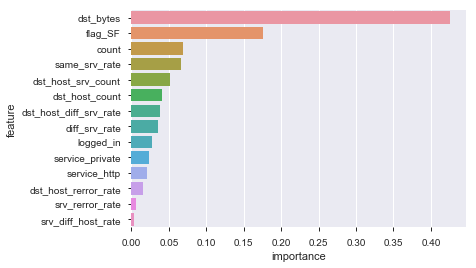

In [189]:
indices = np.argsort(radf_clf.feature_importances_)[::-1]
feature_rank = pd.DataFrame(columns=['rank','feature','importance'])
for f in range(train_X.shape[1]):
    feature_rank.loc[f] = [f+1,
                          train_X.columns[indices[f]],
                          radf_clf.feature_importances_[indices[f]]]

sns.barplot(y='feature',x='importance',data = feature_rank)
    

**Tuning Parameters**

In [190]:
pargrid_rf = {'n_estimators':[50,60,70,80,90],
             'max_features':[5,6,7,8,9]}

gscv_rf = GridSearchCV(estimator = RandomForestClassifier(),
                      param_grid=pargrid_rf,
                      cv = 6,
                      verbose=True, n_jobs=-1) #n_jobs -1 means using all processors to run jobs in parallel

gscv_results = gscv_rf.fit(train[feature_columns],train['attack_new'])

Fitting 6 folds for each of 25 candidates, totalling 150 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done 150 out of 150 | elapsed: 13.1min finished


In [191]:
gscv_results.best_score_

0.995832440284823

In [192]:
gscv_results.best_params_

{'max_features': 7, 'n_estimators': 50}

## KNN

In [195]:
le = preprocessing.LabelEncoder()
for column_name in train.columns:
    if train[column_name].dtype == object:
        train[column_name] == le.fit_transform(train[column_name])
    else:
        pass

In [196]:
for column_name in test.columns:
    if test[column_name].dtype == object:
        test[column_name] = le.fit_transform(test[column_name])
    else:
        pass

C:\Users\ShubhamG\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  This is separate from the ipykernel package so we can avoid doing imports until


In [197]:
knn_clf = KNeighborsClassifier(n_neighbors=6)
knn_clf.fit(train[feature_columns],train['attack_new'])

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
           metric_params=None, n_jobs=None, n_neighbors=6, p=2,
           weights='uniform')

In [198]:
print(metrics.classification_report(test['attack_new'],knn_clf.predict(test[feature_columns])))

              precision    recall  f1-score   support

           0       0.67      0.97      0.79      9711
           1       0.96      0.64      0.77     12833

   micro avg       0.78      0.78      0.78     22544
   macro avg       0.82      0.80      0.78     22544
weighted avg       0.84      0.78      0.78     22544



In [199]:
tuned_parameters = [{'n_neighbors':[5,7,9,11,13,15,17]}]

knn_clf = GridSearchCV(KNeighborsClassifier(),
                      tuned_parameters,
                      cv = 6, scoring='roc_auc')

In [200]:
knn_clf.fit(train[feature_columns],train['attack_new'])

GridSearchCV(cv=6, error_score='raise-deprecating',
       estimator=KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
           metric_params=None, n_jobs=None, n_neighbors=5, p=2,
           weights='uniform'),
       fit_params=None, iid='warn', n_jobs=None,
       param_grid=[{'n_neighbors': [5, 7, 9, 11, 13, 15, 17]}],
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring='roc_auc', verbose=0)

In [201]:
knn_clf.best_score_

0.997692841072652

In [202]:
knn_clf.best_params_

{'n_neighbors': 13}

In [203]:
#with multiple tuning parameters
tuned_parameters = [{'n_neighbors': [9,11,13,15,17,19,21], 'weights': ['distance', 'uniform']}]

knn_clf = GridSearchCV(KNeighborsClassifier(),
                   tuned_parameters,
                   cv=10,
                   scoring='roc_auc')

In [204]:
knn_clf.fit(train[feature_columns],train['attack_new'])

GridSearchCV(cv=10, error_score='raise-deprecating',
       estimator=KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
           metric_params=None, n_jobs=None, n_neighbors=5, p=2,
           weights='uniform'),
       fit_params=None, iid='warn', n_jobs=None,
       param_grid=[{'n_neighbors': [9, 11, 13, 15, 17, 19, 21], 'weights': ['distance', 'uniform']}],
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring='roc_auc', verbose=0)

In [205]:
knn_clf.best_score_

0.99771946197174

In [206]:
knn_clf.best_params_

{'n_neighbors': 15, 'weights': 'uniform'}

In [207]:
knn_clf = KNeighborsClassifier(n_neighbors=15)

In [208]:
knn_clf.fit(train[feature_columns],train['attack_new'])

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
           metric_params=None, n_jobs=None, n_neighbors=15, p=2,
           weights='uniform')

In [209]:
knn_cm = metrics.confusion_matrix(test['attack_new'],knn_clf.predict(test[feature_columns]))

Text(30.5, 0.5, 'Predicted Label')

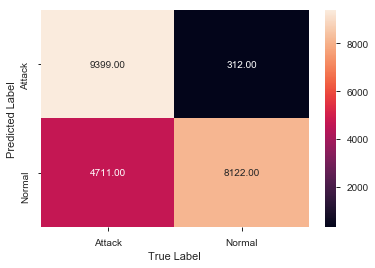

In [210]:
sns.heatmap(knn_cm, annot=True,fmt='.2f',xticklabels=['Attack','Normal'],yticklabels=['Attack','Normal'])
plt.xlabel('True Label')
plt.ylabel('Predicted Label')

In [211]:
metrics.accuracy_score(test['attack_new'],knn_clf.predict(test[feature_columns]))

0.7771912704045423

In [212]:
AUC = metrics.roc_auc_score(test['attack_new'],knn_clf.predict(test[feature_columns]))
print("KNN Model AUC: %.3f"%(AUC))

KNN Model AUC: 0.800


,count,diff_srv_rate,dst_bytes,dst_host_count,dst_host_diff_srv_rate,dst_host_rerror_rate,dst_host_srv_count,flag_SF,logged_in,same_srv_rate,service_http,service_private,srv_diff_host_rate,srv_rerror_rate,attack_new,Split
0,2,0.00,0.0,150,0.03,0.05,25,1,0,1.00,0,0,0.00,0.0,0,Train
1,13,0.15,0.0,255,0.60,0.00,1,1,0,0.08,0,0,0.00,0.0,0,Train
2,123,0.07,0.0,255,0.05,0.00,26,0,0,0.05,0,1,0.00,0.0,1,Train
3,5,0.00,8153.0,30,0.00,0.00,255,1,1,1.00,1,0,0.00,0.0,0,Train
4,30,0.00,420.0,255,0.00,0.00,255,1,1,1.00,1,0,0.09,0.0,0,Train
